<a href="https://colab.research.google.com/github/amirabehery/AMIT/blob/main/CV_ALL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from skimage.io import imread, imsave, imshow
import numpy as np
import matplotlib.pyplot as plt
from skimage import transform
import cv2
from google.colab.patches import cv2_imshow

In [2]:
path1 = '/content/drive/MyDrive/Computer_Vision/airplane.jpg'
path2 = '/content/drive/MyDrive/Computer_Vision/sea.jpg'
path3 = '/content/drive/MyDrive/Computer_Vision/salt.webp'
path4 = '/content/drive/MyDrive/Computer_Vision/edge.jpg'
path5 = '/content/drive/MyDrive/Computer_Vision/einstein.jpg'
path6 = '/content/drive/MyDrive/Computer_Vision/chess.jpg'

# Image Preprocessing skimage definitions

In [3]:
def showImage(path,*, axis='off', title=None):
  img1 = imread(path)
  plt.axis(axis)
  plt.title(title)
  imshow(img1)
  plt.show()
  return img1

In [4]:
def translate_image(image1, xdis, ydis):
    transformation_matrix = transform.SimilarityTransform(translation=(xdis,ydis))
    translated_img = transform.warp(image=image1, inverse_map=transformation_matrix.inverse)
    imshow(translated_img)

In [5]:
def rotate_image(image1, angle, centered=True):
    # define angle
    angle = np.deg2rad(30)
    cos_angle = np.cos(angle)
    sin_angle = np.sin(angle)
    if centered:
        # define Center Point
        center = np.array(image1.shape) // 2
        shift_center = transform.SimilarityTransform(translation=(-center[1],-center[0]))
        rotation_tform = transform.SimilarityTransform(rotation=angle)
        all_trans = shift_center + rotation_tform + shift_center.inverse
    else:
        # rotation_array = np.array([[cos_angle, -1*sin_angle, 0], [sin_angle, cos_angle, 0], [0,0,1]])
        # rotation_matrix = transform.SimilarityTransform(matrix=rotation_array)
        # or 
        all_trans = transform.SimilarityTransform(rotation=angle)
    rot_image = transform.warp(image=image1, inverse_map=all_trans.inverse)
    imshow(rot_image)

In [6]:
def scale_image(image1, scale, centered=True,*,new_center=None):
    if centered:
        if new_center:
          center = new_center
        else:
          center = np.array(image1.shape) // 2
        shift_center = transform.SimilarityTransform(translation=(-center[1],-center[0]))
        scale_matrix = transform.SimilarityTransform(scale=scale)
        scale_transform = shift_center + scale_matrix + shift_center.inverse
    else:
        scale_transform = transform.SimilarityTransform(scale=scale)
    scaled_img = transform.warp(image=image1, inverse_map=scale_transform.inverse)
    imshow(scaled_img)

# Image Preprocessing SKIMAGE

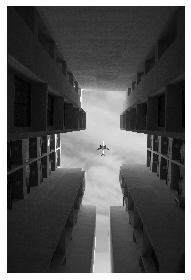

In [7]:
air = showImage(path1)

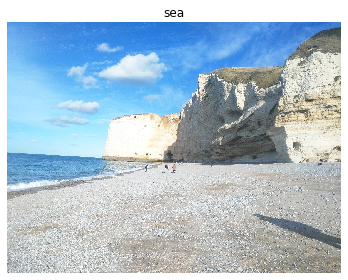

In [8]:
sea = showImage(path2, axis='off',title='sea')

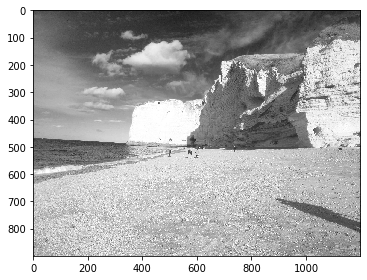

In [9]:
imshow(sea[:,:,0])

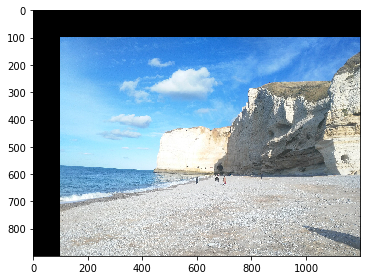

In [10]:
translate_image(sea, 100, 100)

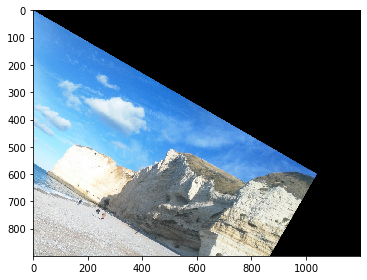

In [11]:
rotate_image(sea, 45, False)

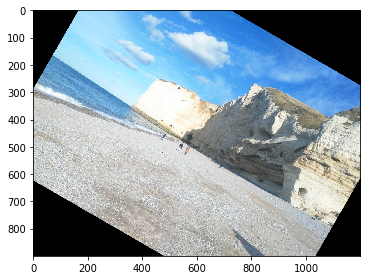

In [12]:
rotate_image(sea, 45, True)

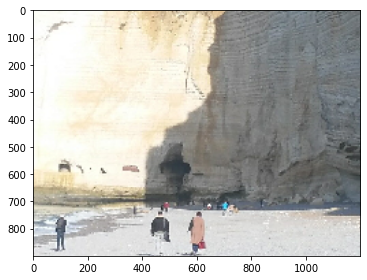

In [13]:
scale_image(sea, 5)

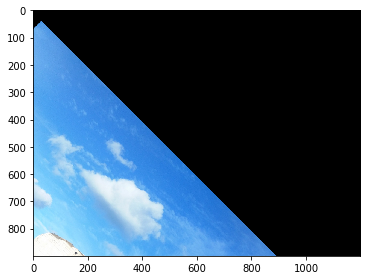

In [14]:
full_trans_matrix = transform.SimilarityTransform(translation=(30,40), rotation=np.deg2rad(45), scale=1.5)
new_trans_image = transform.warp(image=sea, inverse_map=full_trans_matrix.inverse)
imshow(new_trans_image)

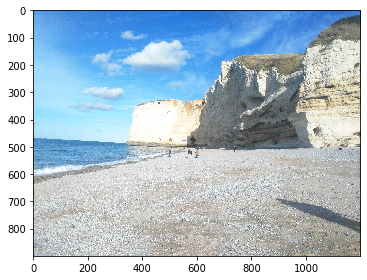

In [15]:
# original image
imshow(sea)

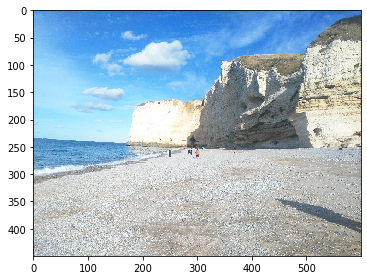

In [16]:
# resize image by slicing
imshow(sea[::2, ::2])

# Image Preprocessing OPENCV_Definitions

In [17]:
def showImage(path,show=True, *, gray=False):
  i1 = cv2.imread(path)
  if gray:
    i1 = cv2.cvtColor(i1, cv2.COLOR_BGR2GRAY)
  if show:
    cv2_imshow(i1)
  return i1

In [18]:
def resize_image(image, scale=1):
  scale_percentage = scale
  width = int(image.shape[1] * scale_percentage)
  height = int(image.shape[0] * scale_percentage)
  dim = (width, height)
  return cv2.resize(image, dim)

In [19]:
def smoothing_image(image, type='mean',show=True):
  """Smoothing image by using mean, median(med) and Gaussian(g) filters"""
  if type == 'mean':
    i = cv2.blur(image, (5,5))
  elif type =='med':
    i = cv2.medianBlur(image, 5)
  elif type =='g':
    i = cv2.GaussianBlur(image, (5,5),0)
  if show:
    cv2_imshow(i)
  return i

In [20]:
def histImage(i):
  hist, bins = np.histogram(i, 256, [0,256])
  plt.figure(figsize=(10,4))
  plt.bar(x=range(256), height=hist)

In [21]:
def equalizeHistImage(path):
  src = showImage(path,False,gray=True)
  eq = cv2.equalizeHist(src)
  return src, eq

Image Preprocessing OpenCV

---

# openCV

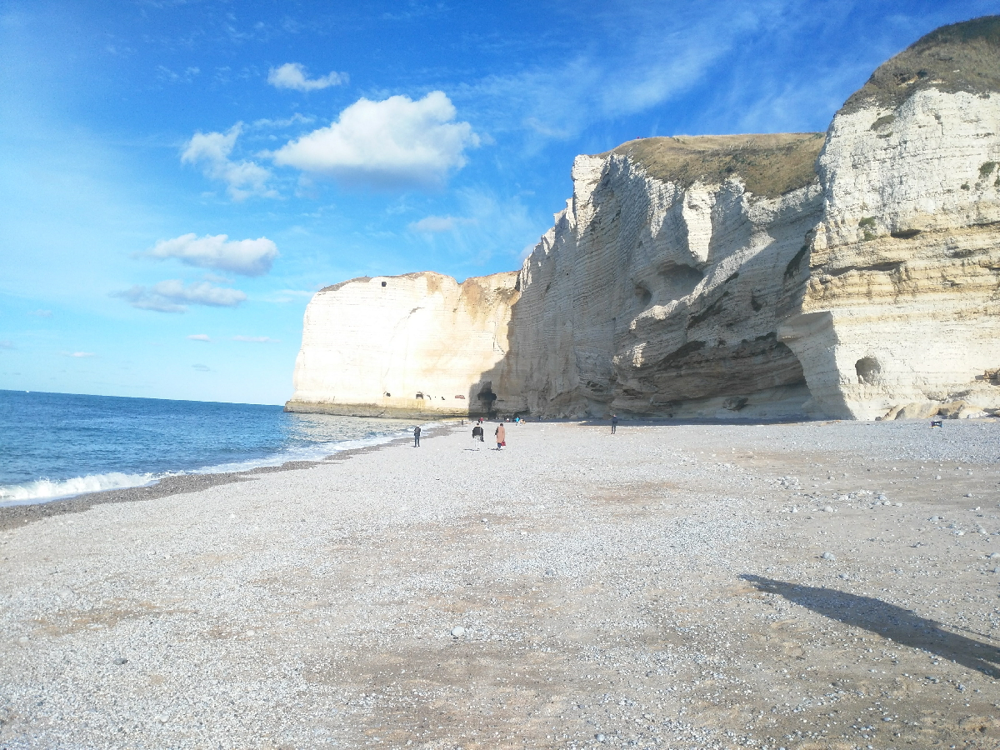

In [22]:
i = showImage(path2)

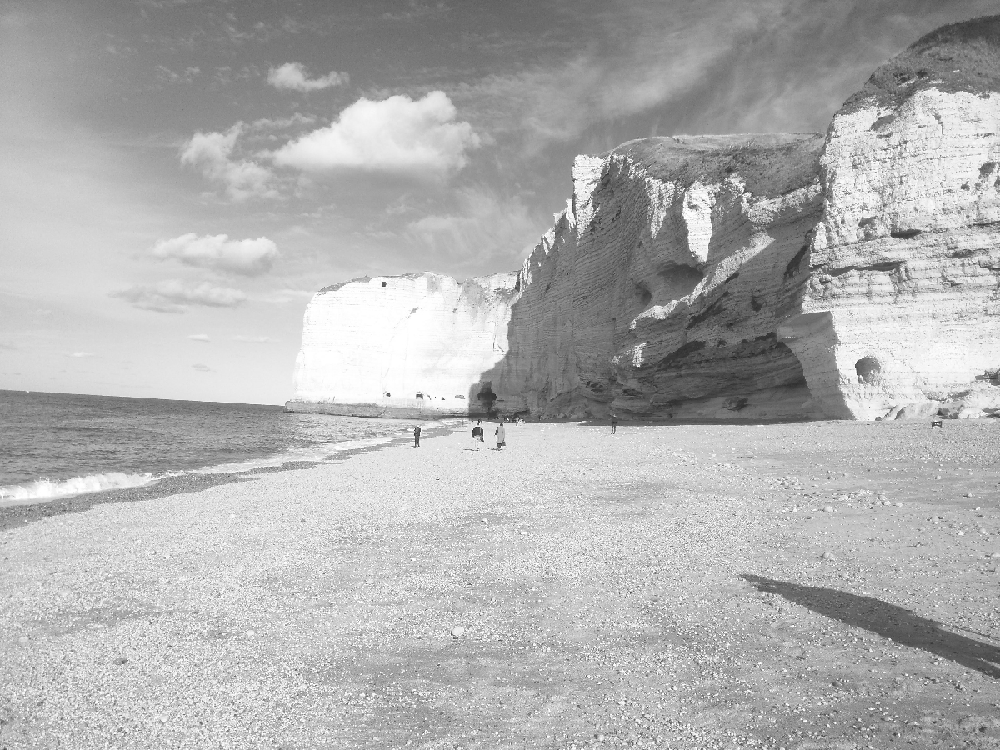

In [23]:
ig = showImage(path2, gray=True)

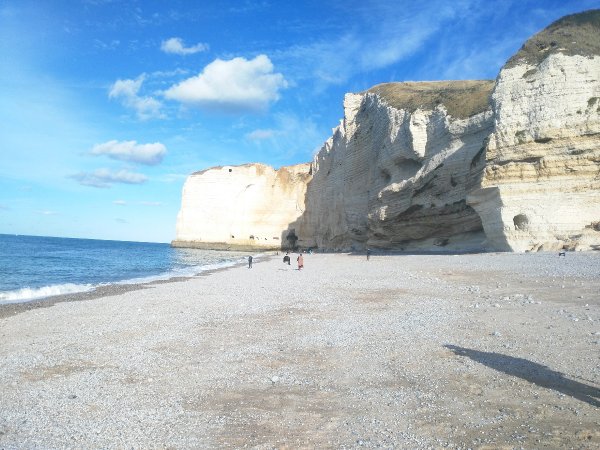

In [24]:
cv2_imshow(resize_image(i, 0.5))

In [25]:
orig = cv2.imread(path3)
mean_i = smoothing_image(orig, type='mean',show=False)
med_i = smoothing_image(orig, type='med',show=False)
guas_i = smoothing_image(orig, type='g',show=False)

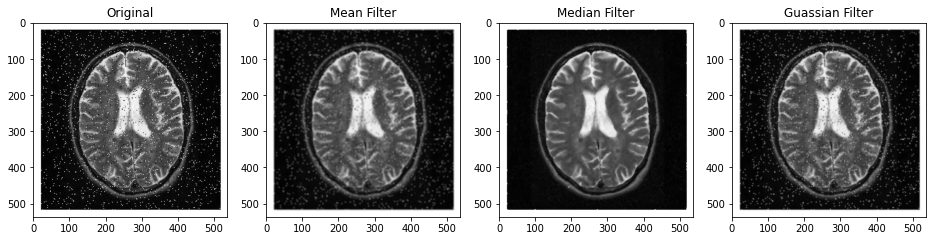

In [26]:
plt.figure(figsize=(16,8))
plt.subplot(1,4,1)
plt.imshow(orig)
plt.title('Original')
plt.subplot(1,4,2)
plt.imshow(mean_i)
plt.title('Mean Filter')
plt.subplot(1,4,3)
plt.imshow(med_i)
plt.title('Median Filter')
plt.subplot(1,4,4)
plt.imshow(guas_i)
plt.title('Guassian Filter')
plt.show()

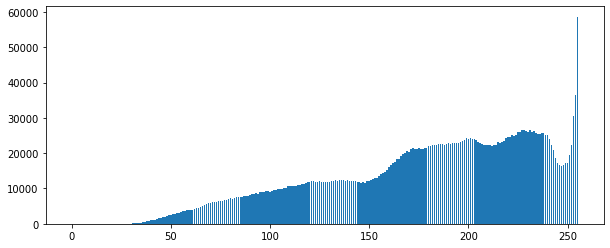

In [27]:
# histogram of image
histImage(sea)

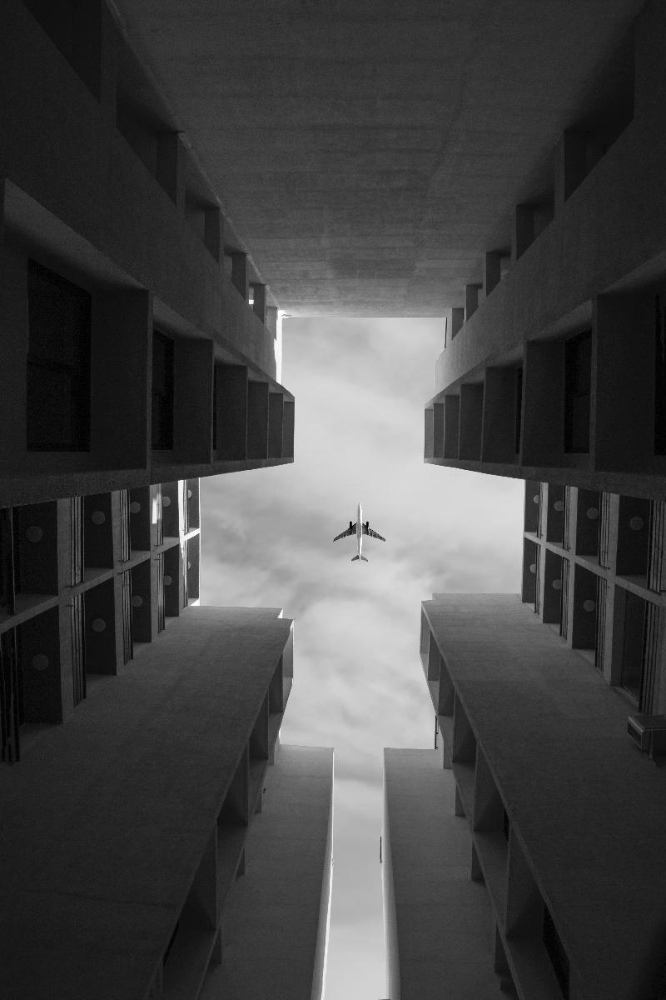

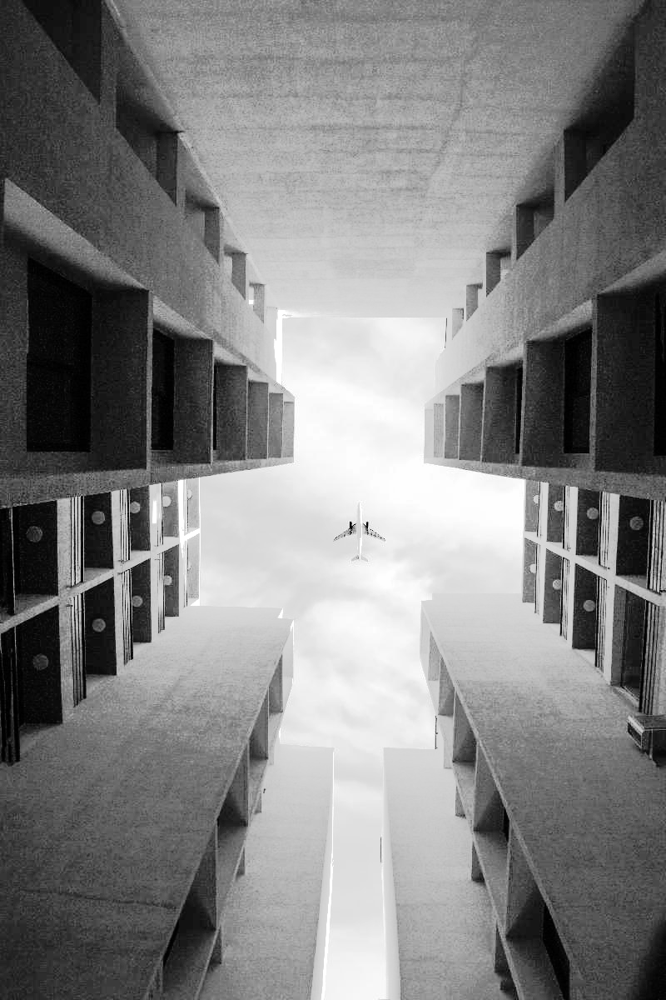

(None, None)

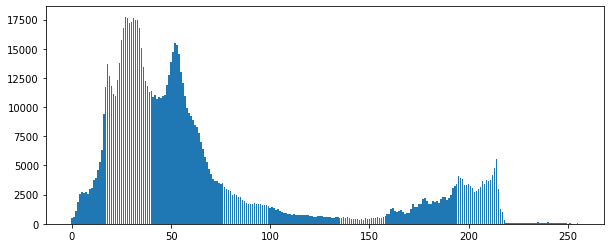

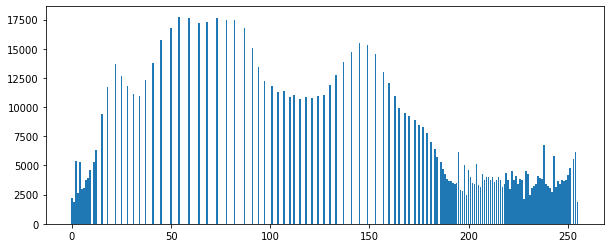

In [28]:
o_image, des_image = equalizeHistImage(path1)

cv2_imshow(o_image), cv2_imshow(des_image)
histImage(o_image), histImage(des_image)

# Edge Detection

# Definitions

In [29]:
def prewittOperator(image, *, show_both=True):
  # first to gray image
  g = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
  # smoothing Gaussian
  gimage = cv2.GaussianBlur(g, (5,5), 0)
  # apply prewitt operator
  kernelx = np.array([[1,1,1], [0,0,0],[-1,-1,-1]])
  kernely = np.array([[1,0,-1], [1,0,-1],[1,0,-1]])
  i_px = cv2.filter2D(g, -1, kernelx)
  i_py = cv2.filter2D(g, -1, kernely)
  if show_both:
    cv2_imshow(i_px)
    cv2_imshow(i_py)
  i_pxy = i_px + i_py
  cv2_imshow(i_pxy)

In [30]:
def sobelOperator(image, *,show_both=True):
  # first to gray image
  g = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
  # smoothing Gaussian
  gimage = cv2.GaussianBlur(g, (5,5), 0)
  # apply sobel operator
  i_sobelx = cv2.Sobel(gimage, cv2.CV_64F,1,0)
  i_sobely = cv2.Sobel(gimage, cv2.CV_64F,0,1)
  if show_both:
    cv2_imshow(i_sobelx)
    cv2_imshow(i_sobely)
  i_sobel = i_sobelx + i_sobely
  cv2_imshow(i_sobel)

In [31]:
def cannyOperator(image,min_threshold=100, max_threshold=200):
  i_canny = cv2.Canny(image, min_threshold, max_threshold)
  cv2_imshow(i_canny)

In [32]:
def laplaceOperator(image):
  # first to gray image
  g = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
  # smoothing Gaussian
  gimage = cv2.GaussianBlur(g, (5,5), 0)
  # apply sobel operator
  l_i = cv2.Laplacian(gimage, cv2.CV_64F)
  cv2_imshow(l_i)

# Operators

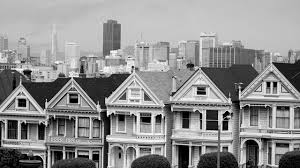

In [33]:
xi = cv2.imread(path4)
cv2_imshow(xi)

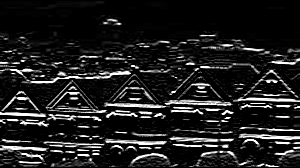

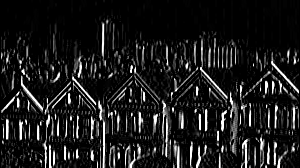

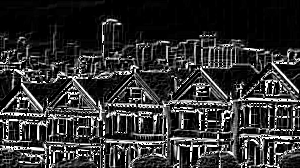

In [34]:
prewittOperator(xi,show_both=True)

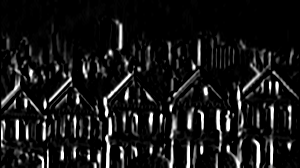

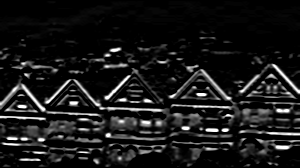

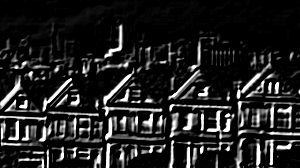

In [35]:
sobelOperator(xi)

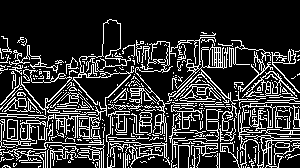

In [36]:
cannyOperator(xi)

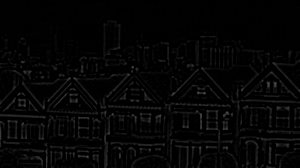

In [37]:
laplaceOperator(xi)

# Image Segmentation

# Thresholding Definitions

In [38]:
def otsuThresholding(image):
  img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  ret, thresh1 = cv2.threshold(img, 120, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)         
  cv2_imshow(thresh1)

# Threshold Segmentation

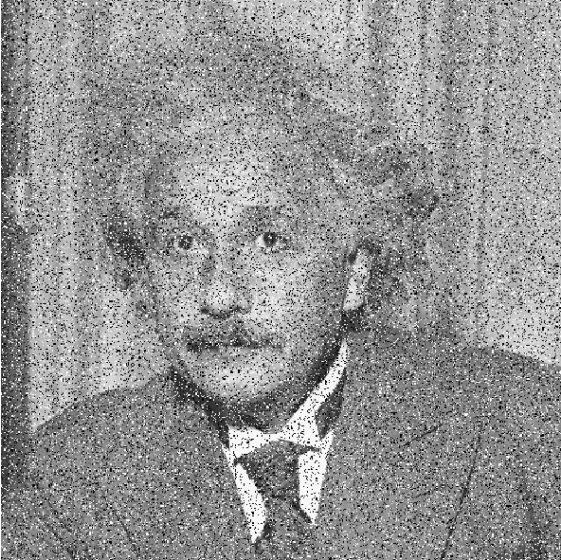

In [39]:
i = cv2.imread(path5)
cv2_imshow(i)

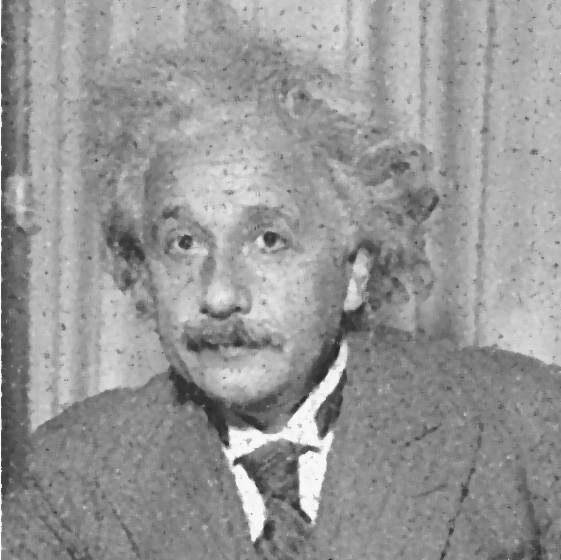

In [40]:
x = smoothing_image(i, type='med',show=True)

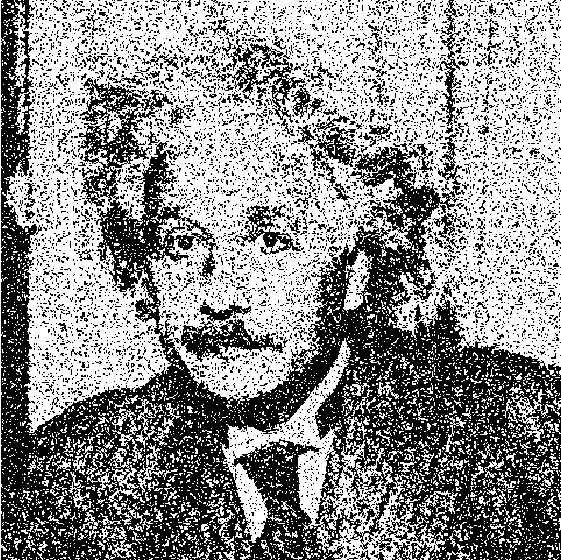

In [41]:
otsuThresholding(i)

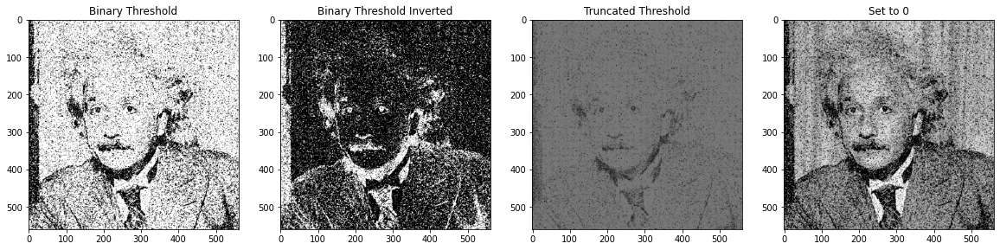

In [42]:
ret, thresh1 = cv2.threshold(i, 120, 255, cv2.THRESH_BINARY)
ret, thresh2 = cv2.threshold(i, 120, 255, cv2.THRESH_BINARY_INV)
ret, thresh3 = cv2.threshold(i, 120, 255, cv2.THRESH_TRUNC)
ret, thresh4 = cv2.threshold(i, 120, 255, cv2.THRESH_TOZERO)

plt.figure(figsize=(20,10))
plt.subplot(1,4,1)
plt.imshow(thresh1)
plt.title('Binary Threshold')
plt.subplot(1,4,2)
plt.imshow(thresh2)
plt.title('Binary Threshold Inverted')
plt.subplot(1,4,3)
plt.imshow(thresh3)
plt.title('Truncated Threshold')
plt.subplot(1,4,4)
plt.imshow(thresh4)
plt.title('Set to 0')
plt.show()

Text(0.5, 1.0, 'Optimal Threshold')

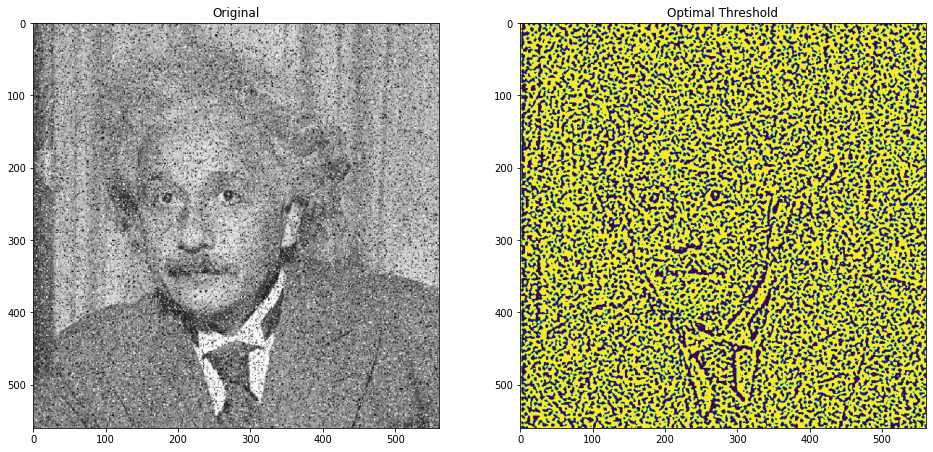

In [43]:
gray = cv2.cvtColor(i, cv2.COLOR_BGR2GRAY)
blurred = cv2.GaussianBlur(gray, (7, 7), 0)

adap_thresh = cv2.adaptiveThreshold(blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 3)
plt.figure(figsize=(16,8))
plt.subplot(1,2,1)
plt.imshow(i)
plt.title('Original')
plt.subplot(1,2,2)
plt.imshow(adap_thresh)
plt.title('Optimal Threshold')

# Feature Extraction (Harris Corner)

In [54]:
def harrisCorner(path, *, red_corners = True):
  # harris Corner
  himg = cv2.imread(path)
  # step1 convert to gray
  g = cv2.cvtColor(himg, cv2.COLOR_BGR2GRAY)
  # step2 convert to float
  g = np.float32(g)
  # apply harris corner
  result_image = cv2.cornerHarris(g, 5, 3, 0.04)
  # applt dilation to fill gaps in the result
  dilated_image = cv2.dilate(result_image, None)
  if red_corners:
    himg[result_image > 0.5 * dilated_image.max()] = [0,0,255]
    cv2_imshow(himg)
  else:
    cv2_imshow(dilated_image)

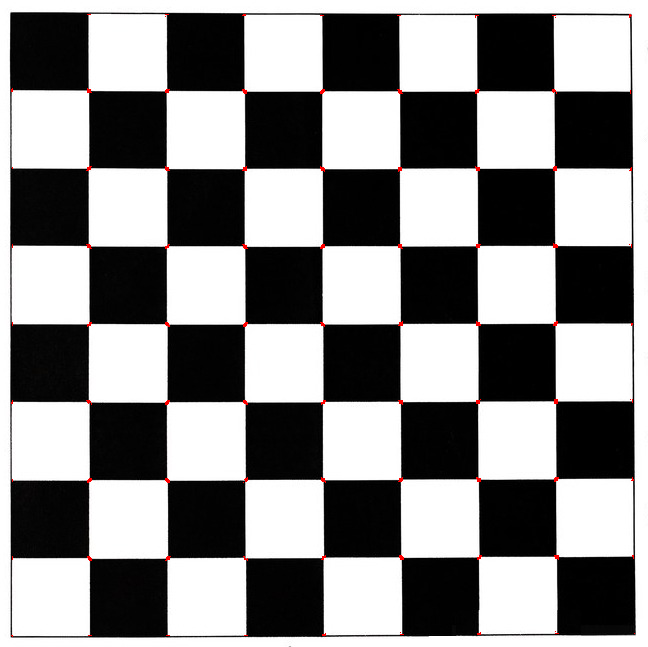

In [55]:
harrisCorner(path6)

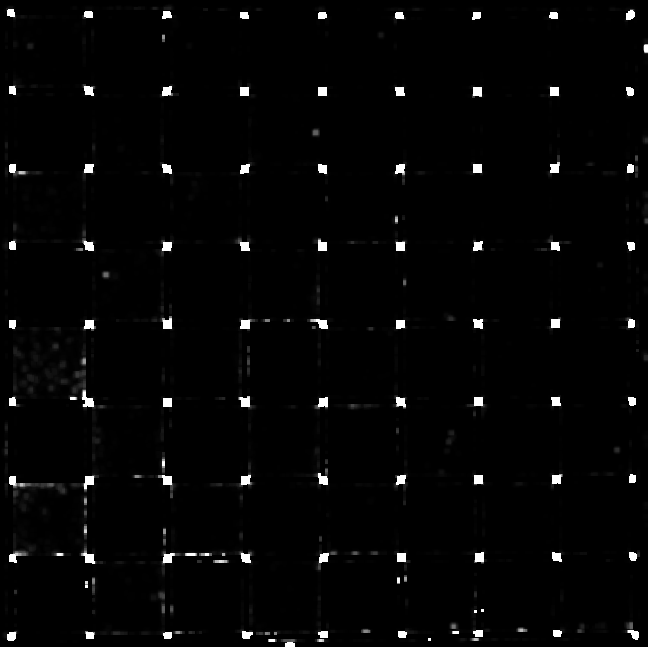

In [58]:
harrisCorner(path6, red_corners=False)

# SIFT_scale-invariant feature transform (SIFT)

In [59]:
eiffel_original_path = '/content/drive/MyDrive/Computer_Vision/original_effil.png'
eiffel_rotated_path = '/content/drive/MyDrive/Computer_Vision/rotated_effil.png'

In [62]:
def circleSiftFeatures(path):
  o = cv2.imread(path)
  gray1 = cv2.cvtColor(o, cv2.COLOR_BGR2GRAY)
  #keypoints
  sift = cv2.xfeatures2d.SIFT_create()
  keypoints_1, descriptors_1 = sift.detectAndCompute(o,None)
  img_1 = cv2.drawKeypoints(gray1,keypoints_1,o)
  cv2_imshow(img_1)

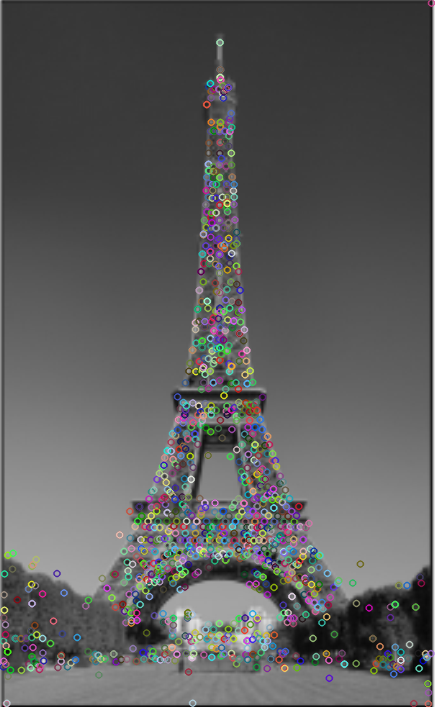

In [63]:
circleSiftFeatures(eiffel_original_path)

In [65]:
def matchImagesBySift(path1, path2):
  img1 = cv2.imread(path1)  
  img2 = cv2.imread(path2) 

  img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
  img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

  #sift
  sift = cv2.xfeatures2d.SIFT_create()

  keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
  keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)

  #feature matching
  bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

  matches = bf.match(descriptors_1,descriptors_2)
  matches = sorted(matches, key = lambda x:x.distance)

  img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:50], img2, flags=2)
  cv2_imshow(img3)
  plt.show()

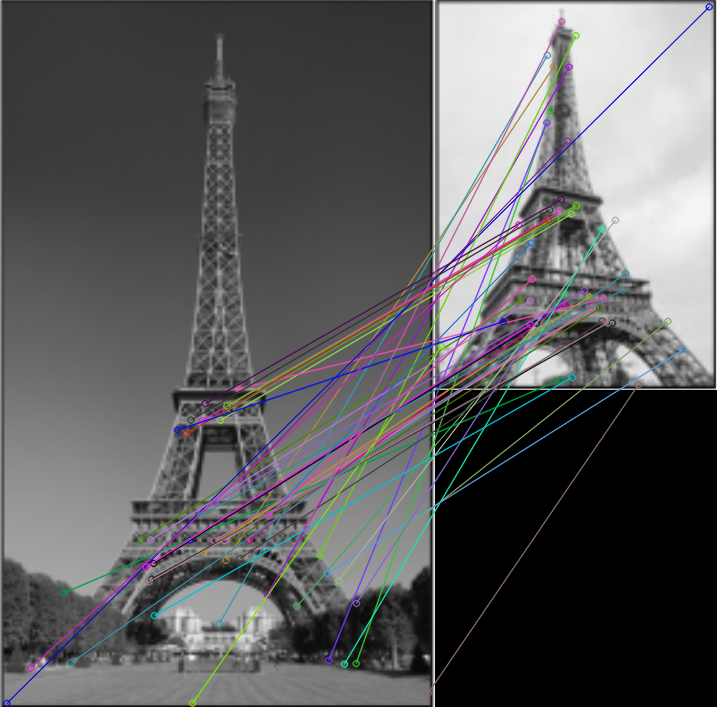

In [66]:
matchImagesBySift(eiffel_original_path, eiffel_rotated_path)